<a href="https://colab.research.google.com/github/ialreadysaidyes/dscryb-prompt-to-video/blob/main/dscryb_spoofs_audio_to_video_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@title Check gpu
# show the graphics card we are using
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

# Web scrape descriptions from the free options at https://dscryb.com/

In [2]:
import requests
from bs4 import BeautifulSoup

URL = "https://dscryb.com/scenes/monsters/"
page = requests.get(URL)

In [ ]:
# parse for class of interest in the Free Monsters section
soup = BeautifulSoup(page.content, "html.parser")
free_monsters = soup.find("div", class_= "elementor-posts-container elementor-posts elementor-posts--skin-classic elementor-grid")
monster_name = free_monsters.find_all("h3", class_='elementor-post__title')
monsters_url = free_monsters.find_all("a")
print(monsters_url)


In [4]:
# for monster in monsters_url:
#   print(monster['href'])

https://dscryb.com/scene/a-goblin-fires-an-arrow-at-you/
https://dscryb.com/scene/a-torn-page-from-nuldys-compendium-of-insect-inquiries/
https://dscryb.com/scene/aberrant-spirit-creature/
https://dscryb.com/scene/adult-brass-dragon/
https://dscryb.com/scene/air-elemental/
https://dscryb.com/scene/ancient-gold-dragon/
https://dscryb.com/scene/ancient-red-dragon/
https://dscryb.com/scene/aquatic-lawnmower-mimic/
https://dscryb.com/scene/astral-dreadnought/
https://dscryb.com/scene/awakened-shrub-with-club/
https://dscryb.com/scene/black-dragon-wyrmling/
https://dscryb.com/scene/bones-of-big-animal-in-swamp/
https://dscryb.com/scene/burrowing-wurm/
https://dscryb.com/scene/chitinous-yugoloth/
https://dscryb.com/scene/colossal-dragon/
https://dscryb.com/scene/couatl/
https://dscryb.com/scene/deal-with-the-devil/
https://dscryb.com/scene/demogorgon/
https://dscryb.com/scene/drow/
https://dscryb.com/scene/dust-mephit/
https://dscryb.com/scene/earth-genie/
https://dscryb.com/scene/emaciated-

In [5]:
# create dictionary to store information for later processing
media_dict = {}
for i in range(len(monsters_url)):
  monsters_name = free_monsters.find_all('a')[i]
  for monster in monsters_name:
    key = i
  media_dict[i] = [monster.strip(), monsters_url[i]['href']]
print(media_dict)

{0: ['A Goblin Fires an Arrow at You', 'https://dscryb.com/scene/a-goblin-fires-an-arrow-at-you/'], 1: ['A Torn Page from Nuldy’s Compendium of Insect Inquiries', 'https://dscryb.com/scene/a-torn-page-from-nuldys-compendium-of-insect-inquiries/'], 2: ['Aberrant Spirit Creature', 'https://dscryb.com/scene/aberrant-spirit-creature/'], 3: ['Adult Brass Dragon', 'https://dscryb.com/scene/adult-brass-dragon/'], 4: ['Air Elemental', 'https://dscryb.com/scene/air-elemental/'], 5: ['Ancient Gold Dragon', 'https://dscryb.com/scene/ancient-gold-dragon/'], 6: ['Ancient Red Dragon', 'https://dscryb.com/scene/ancient-red-dragon/'], 7: ['Aquatic Lawnmower Mimic', 'https://dscryb.com/scene/aquatic-lawnmower-mimic/'], 8: ['Astral Dreadnought', 'https://dscryb.com/scene/astral-dreadnought/'], 9: ['Awakened Shrub with Club', 'https://dscryb.com/scene/awakened-shrub-with-club/'], 10: ['Black Dragon Wyrmling', 'https://dscryb.com/scene/black-dragon-wyrmling/'], 11: ['Bones of Big Animal in Swamp', 'https:

In [6]:
# use URL values from media_dict to scrape monster descriptions:
scene_dict = {}
for idx, [k,v] in media_dict.items():
  r = requests.get(v)
  soup = BeautifulSoup(r.content, 'html.parser')
  monstertext = soup.find_all('p')[1]
  for monster in monstertext:
    print(idx)
    print(k)
    print(monster)
    scene_description = monster
  scene_dict[idx] = [k, scene_description]
print(scene_dict)

0
A Goblin Fires an Arrow at You
The little creature nocks an arrow in their bow, carefully aiming until they’re sure it will hit its target, and releases. The arrow flies toward you quicker than a bird, puncturing a small but painful hole in your body.
1
A Torn Page from Nuldy’s Compendium of Insect Inquiries
In many regions of the civilized-yet-recluse world, communities are well acquainted with the infamous folklore of the Dung Beetle. These timid insects incite fear in commoners—they are a deadly infestation—and adventurers. Amassing large hoards of refuse, these beetles possess the innate magic to set dung on fire and fling it with amazing accuracy. Small explosions immediately follow something being hit by one of these flaming dung balls. A single Dung Beetle is manageable, but where there is one, there are said to be many more, and a swarm is a curse. Best to give this beetle plenty of space and keep your latrine clean.
2
Aberrant Spirit Creature
Most creatures in the world are 

In [7]:
# that looks like it worked pretty well for the most part. tidy it up into a nice panda dataframe
import pandas as pd

df = pd.DataFrame.from_dict(scene_dict, orient='index', columns=["scene", "description"])
df.head()

,scene,description
0,A Goblin Fires an Arrow at You,The little creature nocks an arrow in their bo...
1,A Torn Page from Nuldy’s Compendium of Insect ...,In many regions of the civilized-yet-recluse w...
2,Aberrant Spirit Creature,Most creatures in the world are visible becaus...
3,Adult Brass Dragon,Webbed fins unfurl from the neck of this massi...
4,Air Elemental,"A contained haze—part mirage, part fog—whisper..."


In [ ]:
# save this dataframe as a cvs
df.to_csv('dscrb_scrape.csv', encoding='utf-8')
# copy files to gdrive
import os
from pathlib import Path
Path('/content/drive/MyDrive/Spoofs_animated/').mkdir(parents=True, exist_ok=True)
# !cp '/content/dscrb_scrape.csv' '/content/drive/MyDrive/Spoofs_animated/'

# or skip here to wget scraped descriptions and choose the scene you want!


In [63]:
# now that csv has been created it can be copy'd from gdrive in future creations to not have to recreate everything hitherto
import pandas as pd
# import os
# from pathlib import Path
# get pregenerated csv file from github
!wget https://raw.githubusercontent.com/ialreadysaidyes/dscryb-prompt-to-video/main/dscrb_scrape.csv
df = pd.read_csv("/content/dscrb_scrape.csv")
del df['Unnamed: 0']
df
# df.iloc[0]

--2022-11-22 11:46:36--  https://raw.githubusercontent.com/ialreadysaidyes/dscryb-prompt-to-video/main/dscrb_scrape.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 32702 (32K) [text/plain]
Saving to: ‘dscrb_scrape.csv.1’

dscrb_scrape.csv.1  100%[===================>]  31.94K  --.-KB/s    in 0s      

2022-11-22 11:46:36 (114 MB/s) - ‘dscrb_scrape.csv.1’ saved [32702/32702]



,scene,description
0,A Goblin Fires an Arrow at You,The little creature nocks an arrow in their bo...
1,A Torn Page from Nuldy’s Compendium of Insect ...,In many regions of the civilized-yet-recluse w...
2,Aberrant Spirit Creature,Most creatures in the world are visible becaus...
3,Adult Brass Dragon,Webbed fins unfurl from the neck of this massi...
4,Air Elemental,"A contained haze—part mirage, part fog—whisper..."
...,...,...
79,Wererat Transformation,The halfling pauses—looking at you as if consi...
80,Young Copper Dragon,"Shadows obscure the hills, and from them a ser..."
81,Young Gold Dragon,The golden body moves in flight with such sinu...
82,Zombie,"Rot bloats the flesh of the corpse, and what b..."


In [75]:
# enter the index of the scene you want to generate
index_of_description = 80 # @param from csv => pandas df

# Use Spoofs API https://spoofsapp.com/
## Your Words. Different Voice. Realistic voice replacement powered by clever A.I. technology and you.
### To generate audio narrative from descriptions
---



In [76]:
# Use Spoofs https://spoofsapp.com/ API for audio generation using TTS
# Your Words. Different Voice. Realistic voice replacement powered by clever A.I. technology and you.
# Connect to Spoofs API for David Attenborough
!pip install requests
import requests
# api-endpoint
URL = "https://ijg55w4sf9.execute-api.us-east-2.amazonaws.com/spoofs-api/tts"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [77]:
# we'll use david attenborough to generate description audio and then select the description we want
# To Do: add dictionary of current Spoofs roster
VOICE_NAME = "david_attenborough"


# defining a params dict for the parameters to be sent to the API
PARAMS = {"voice_name": VOICE_NAME, 
        "text": df.iloc[index_of_description][0] + '. ' + df.iloc[index_of_description][1], 
        "denoise": "35", 
        "audio_id": "1",
        "debug": True} 
  
# sending get request and saving the response as response object
x = requests.post(URL, json = PARAMS, stream=True)

# Write the output to disk
with open(str(df.iloc[index_of_description][0]).lower().replace(" ", "") + '.wav', 'wb') as handle:
    for block in x.iter_content(1024):
        handle.write(block)

# this looks good so moving onto video creation using stable diffusion

In [78]:
import IPython
IPython.display.Audio(str(df.iloc[index_of_description][0]).lower().replace(" ", "") + '.wav')

In [79]:
# initial image made using just the scene prompt and will now have iterations produced using increasingly longer prompts using the scene description by fragment split by re 
full_prompt = str(df.iloc[index_of_description][0] +'. ' + df.iloc[index_of_description][1])
print(full_prompt)

import re
prompt_list = re.split('[?.,!]', full_prompt)
# prompt_list

# sanitize prompt_list
import string
temp_list = []
for p in prompt_list:
  #make translator object
  translator=str.maketrans('','',string.punctuation)
  p.translate(translator).lower()
  temp_list.append(p)#.translate(translator).lower())
prompt_list = temp_list
prompt_list

Young Copper Dragon. Shadows obscure the hills, and from them a serpentine creature the size of an ox emerges with an otherworldly grace, wings tucked tight against its sides. The dappled sunlight catches scales of gleaming copper. A hiss issues forth, reptilian, as the creature regards you with cunning eyes and slowly circles—watching and waiting.


['Young Copper Dragon',
 ' Shadows obscure the hills',
 ' and from them a serpentine creature the size of an ox emerges with an otherworldly grace',
 ' wings tucked tight against its sides',
 ' The dappled sunlight catches scales of gleaming copper',
 ' A hiss issues forth',
 ' reptilian',
 ' as the creature regards you with cunning eyes and slowly circles—watching and waiting',
 '']

In [80]:
# which would make the nth prompt for the init image...
def prompt_you_want(number: int):
  prompt_you_want = ""
  prompt_num = number
  for i in range(number):
    if i == 0:
      prompt_you_want = prompt_list[i] + style_description
      # print(prompt_you_want)
    else:
      prompt_you_want = ""
      prompt_you_want += prompt_list[i] + ", " + prompt_list[i-1]
      prompt_you_want += style_description
  return prompt_you_want.strip()
# prompt_you_want(1)

In [81]:
# create your own style description or use one of the following to be appended to the end of each prompt for image production
style_description = ", centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo"
# style_description = ", centered, wuxia, fantasy, elegant, intricate, by stanley artgerm lau, greg rutkowski, thomas kindkade, alphonse mucha, loish, norman rockwell"
# style_description = ", centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo"


# Login for HuggingFace and Google Drive, imports, and processing for chosen description

## imports and login for huggingface and gdrive

In [31]:
# get the necessary imports for stable diffusion
!pip install --upgrade diffusers transformers scipy
!pip install accelerate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 304 kB 33.2 MB/s 
     |████████████████████████████████| 5.5 MB 53.2 MB/s 
     |████████████████████████████████| 182 kB 68.6 MB/s 
     |████████████████████████████████| 7.6 MB 55.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 175 kB 13.9 MB/s 


In [32]:
# login with huggingface
from huggingface_hub import notebook_login
notebook_login()

Token is valid.
Your token has been saved in your configured git credential helpers (store).
Your token has been saved to /root/.huggingface/token
Login successful


In [33]:
# login with gdrive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [34]:
# creation of stable diffusion pipeline and turning off of NSFW filter (it gets in the way even when not questionable content is generated)
from diffusers import StableDiffusionPipeline
import torch
model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16, revision="fp16")
pipe = pipe.to("cuda")

# disable NSWF filter
def dummy(images, **kwargs):
    return images, False
pipe.safety_checker = dummy

Downloading:   0%|          | 0.00/543 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/342 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.70k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/608M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/284 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/636 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/246M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/472 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/822 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/806 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/609 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/167M [00:00<?, ?B/s]

ftfy or spacy is not installed using BERT BasicTokenizer instead of ftfy.


# Option 1. If you want to select specific images per prompt by seed choose this

In [40]:
print("You need to add " + str(len(prompt_list)) + " seed values from the below generation to the seedValuelist")

You need to add 3 seed values from the below generation to the seedValuelist


Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  3629025402


  0%|          | 0/21 [00:00<?, ?it/s]

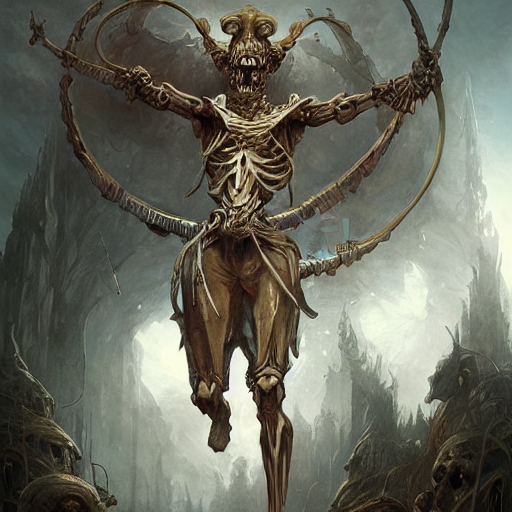

Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  1194465501


  0%|          | 0/21 [00:00<?, ?it/s]

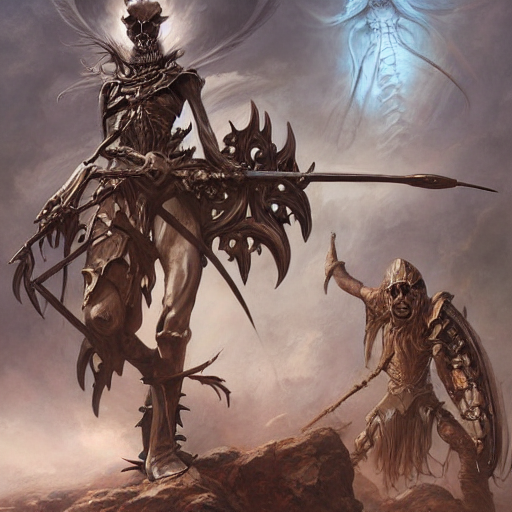

Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  733623059


  0%|          | 0/21 [00:00<?, ?it/s]

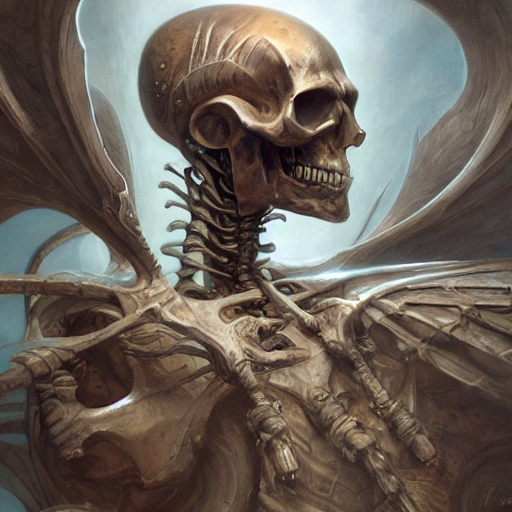

Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  161846518


  0%|          | 0/21 [00:00<?, ?it/s]

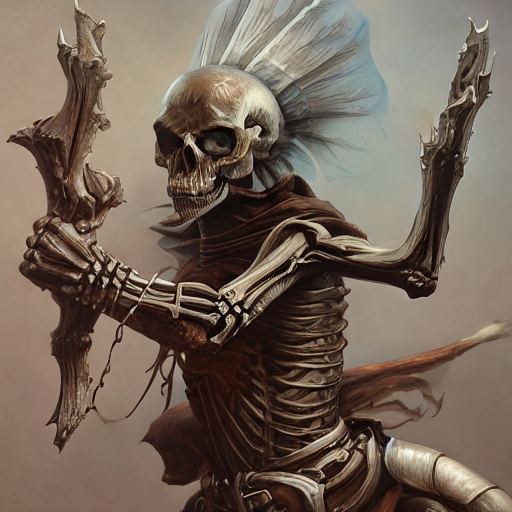

Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  2252559671


  0%|          | 0/21 [00:00<?, ?it/s]

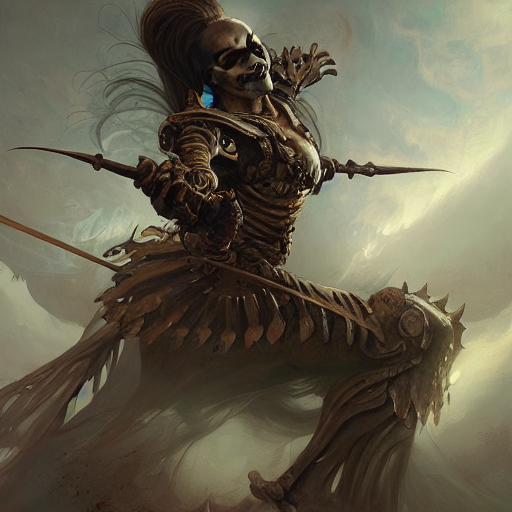

Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  3211840296


  0%|          | 0/21 [00:00<?, ?it/s]

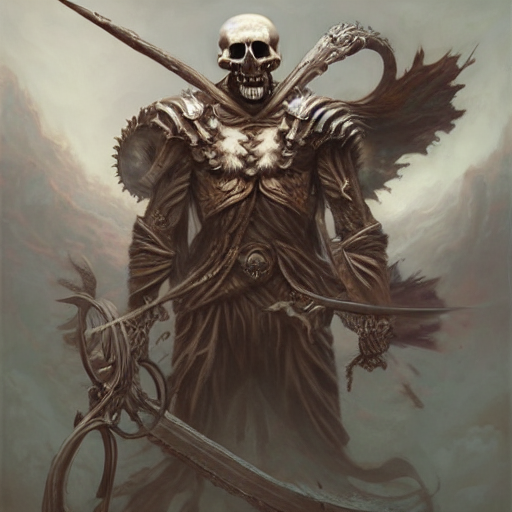

Please input your favorite Seed value for this prompt: 3629025402


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['endecker, wlop, boris vallejo <|endoftext|>']


] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  847492939


  0%|          | 0/21 [00:00<?, ?it/s]

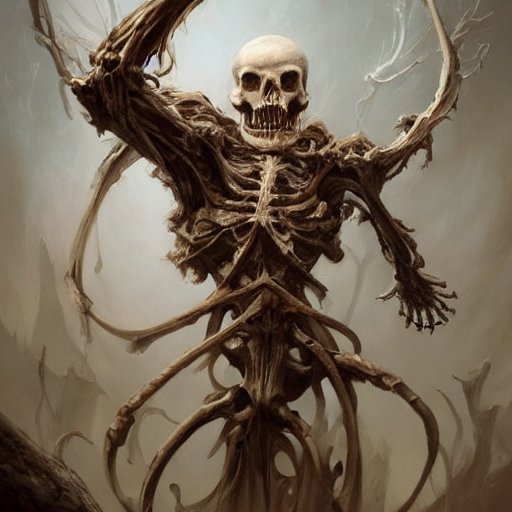

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['endecker, wlop, boris vallejo <|endoftext|>']


] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  3921811953


  0%|          | 0/21 [00:00<?, ?it/s]

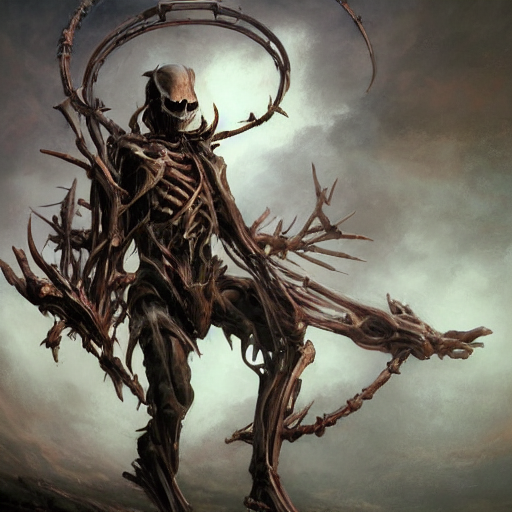

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['endecker, wlop, boris vallejo <|endoftext|>']


] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  2736046489


  0%|          | 0/21 [00:00<?, ?it/s]

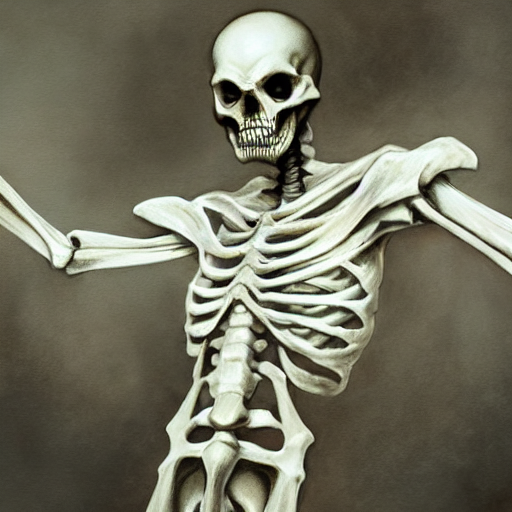

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['endecker, wlop, boris vallejo <|endoftext|>']


] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  3022123549


  0%|          | 0/21 [00:00<?, ?it/s]

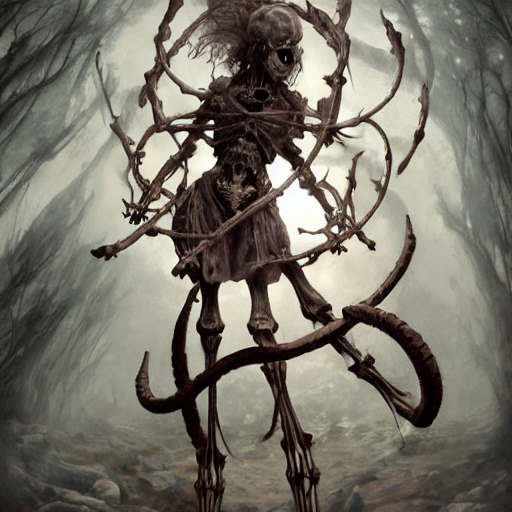

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['endecker, wlop, boris vallejo <|endoftext|>']


] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  678507228


  0%|          | 0/21 [00:00<?, ?it/s]

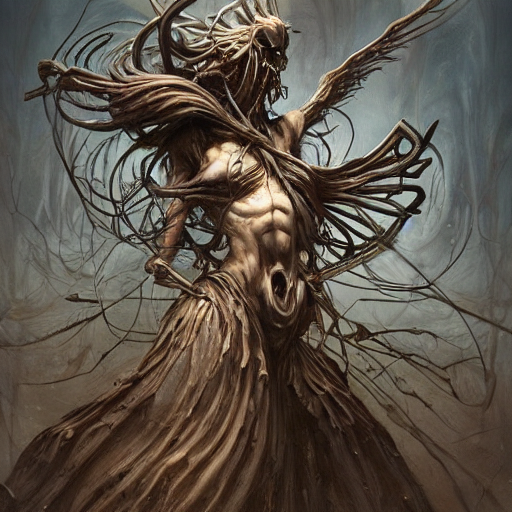

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['endecker, wlop, boris vallejo <|endoftext|>']


] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  2409476080


  0%|          | 0/21 [00:00<?, ?it/s]

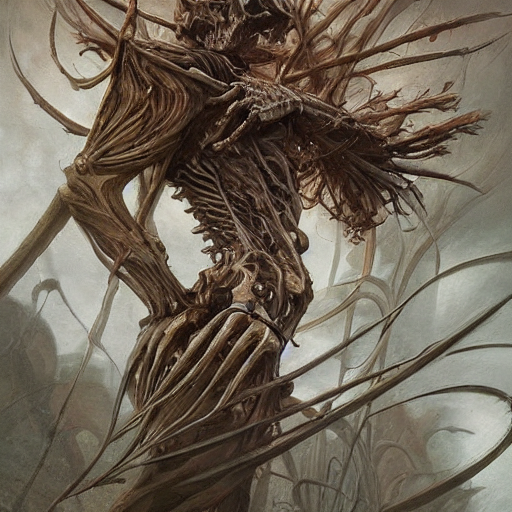

Please input your favorite Seed value for this prompt: 3022123549


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', wlop, boris vallejo <|endoftext|>']


,  ] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  3455675340


  0%|          | 0/21 [00:00<?, ?it/s]

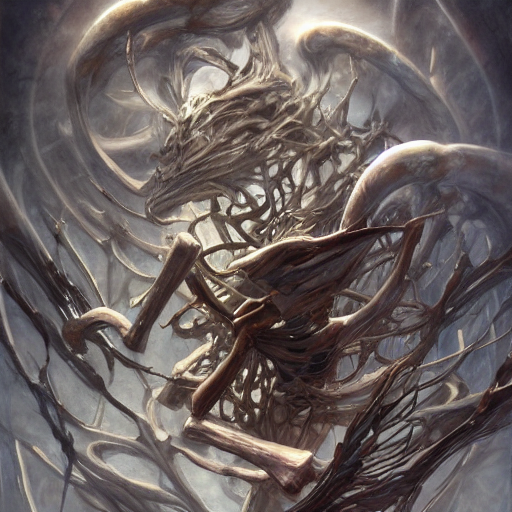

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', wlop, boris vallejo <|endoftext|>']


,  ] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  2559455527


  0%|          | 0/21 [00:00<?, ?it/s]

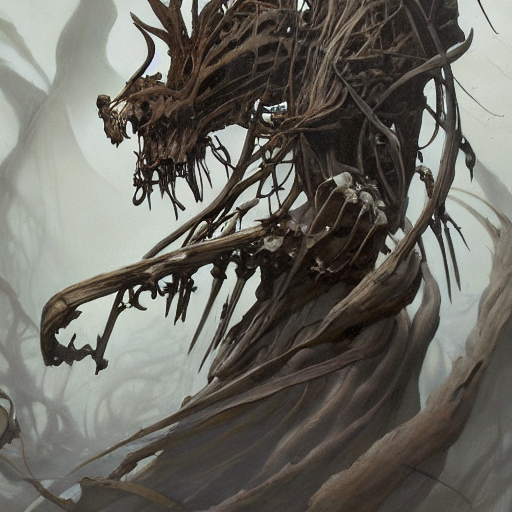

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', wlop, boris vallejo <|endoftext|>']


,  ] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  339896583


  0%|          | 0/21 [00:00<?, ?it/s]

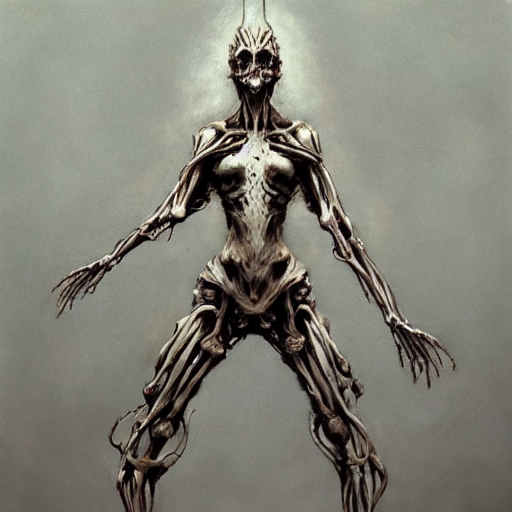

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', wlop, boris vallejo <|endoftext|>']


,  ] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  1656493052


  0%|          | 0/21 [00:00<?, ?it/s]

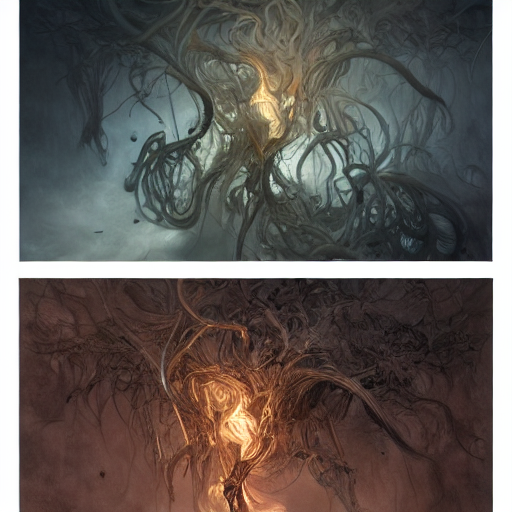

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', wlop, boris vallejo <|endoftext|>']


,  ] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  3406523904


  0%|          | 0/21 [00:00<?, ?it/s]

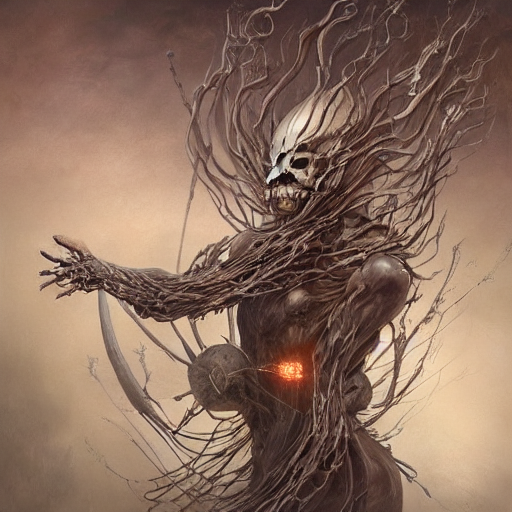

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', wlop, boris vallejo <|endoftext|>']


,  ] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  4241119346


  0%|          | 0/21 [00:00<?, ?it/s]

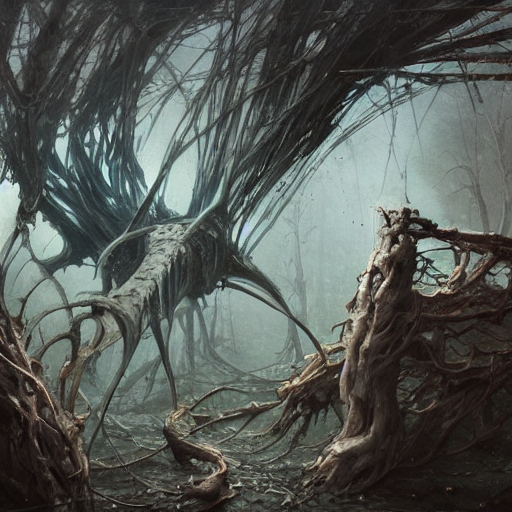

Please input your favorite Seed value for this prompt: 3455675340


In [44]:
import random
seedValuelist = []
# select how many images to generate for init image and copy the seedValue 
for initimage in range(len(prompt_list)):
  num_images = 6
  for i in range(num_images):
    seedValue=random.randint(0,4294967295)
    # torch.manual_seed(seedValue)
    # print(prompt)
    print(prompt_you_want(initimage + 1))
    print("Seed value: ", seedValue)
    generator = torch.Generator("cuda").manual_seed(seedValue)
    images = pipe(prompt_you_want(initimage+1), guidance_scale=7.5, num_inference_steps = 20, generator=generator).images[0]
    display(images)
  seed = input("Please input your favorite Seed value for this prompt: ")
  seedValuelist.append(seed)
print("Thank you. These values will now be used to generate and save the images you requested.")

  0%|          | 0/101 [00:00<?, ?it/s]

Prompt: Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  4241119346


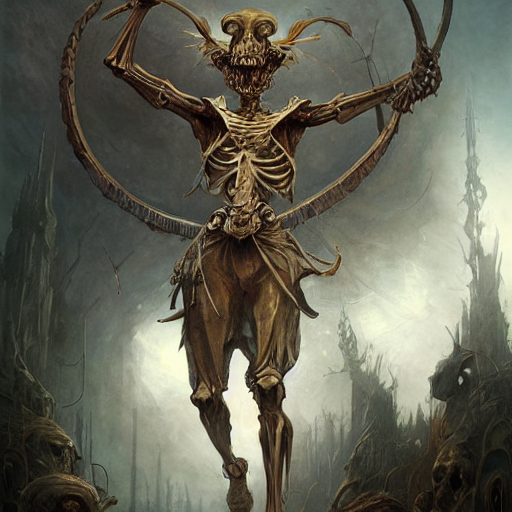

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['endecker, wlop, boris vallejo <|endoftext|>']


  0%|          | 0/101 [00:00<?, ?it/s]

Prompt: ] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, Skeleton Warrior, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  4241119346


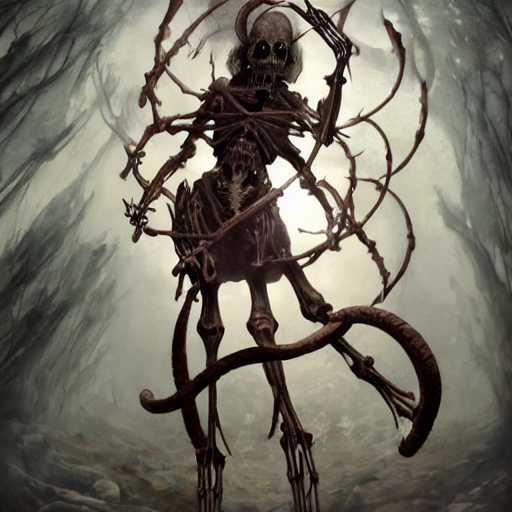

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', wlop, boris vallejo <|endoftext|>']


  0%|          | 0/101 [00:00<?, ?it/s]

Prompt: ,  ] The final blow to its frame sends individual bones spiraling through the air as if a spring had been sprung—no longer held together by dark magic, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo
Seed value:  4241119346


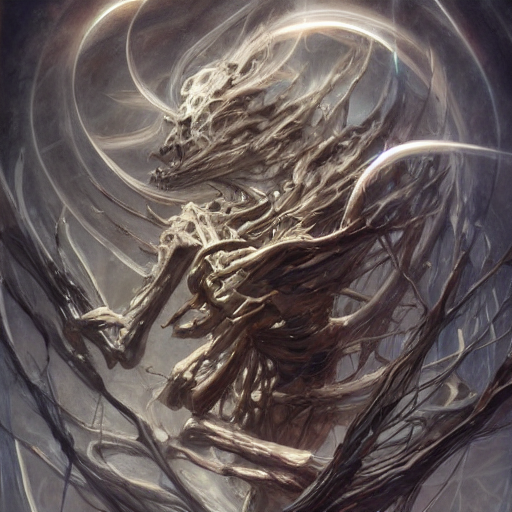

In [47]:
# generate the images from the values input above
i = 1
for seed in seedValuelist:
  generator = torch.Generator("cuda").manual_seed(int(seed))
  images = pipe(prompt_you_want(i), guidance_scale=7.5, num_inference_steps = 100, generator=generator).images[0]
  images.save(str(df.iloc[index_of_description][0]).lower().replace(" ", "") + str(i) + ".png")
  print("Prompt: " + prompt_you_want(i))
  print("Seed value: ", seedValue)
  display(images)
  i +=1
# print(seedValuelist)

## Compile the video

In [48]:
!pip install ffmpeg-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [49]:
# get duration of audio
import ffmpeg
probe = ffmpeg.probe(str(df.iloc[index_of_description][0]).lower().replace(" ", "") + '.wav')
duration = round(float((probe['streams'][0]['duration'])),2)
print("Total time of audio: " + str(duration))
per_prompt = round(duration/len(prompt_list),2)
print("Time spent for image(s) per prompt: " + str(per_prompt))
framerate = round(1/per_prompt,2)
print(framerate)

Total time of audio: 11.3
Time spent for image(s) per prompt: 3.77
0.27


In [50]:
# list of sorted
import glob
images = glob.glob('/content' + '/*.png')
images.sort()
print(images)
# framerate = len(images)
# print(framerate)

['/content/skeletonwarrior1.png', '/content/skeletonwarrior2.png', '/content/skeletonwarrior3.png']


In [51]:
!ffmpeg -framerate $framerate -pattern_type glob -i "*.png" -vcodec libx264 \
-pix_fmt yuv420p -r 30 -threads 4 -crf 25 -refs 1 -bf 0 -coder 0 -g 25 \
-keyint_min 15 -movflags +faststart temp.mp4

ffmpeg version 3.4.11-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-li

In [52]:
spoof_audio = str(df.iloc[index_of_description][0]).lower().replace(" ", "") + '.wav'
print(spoof_audio)
output_filename = str(df.iloc[index_of_description][0]).lower().replace(" ", "") + '.mp4'
print(output_filename)
!ffmpeg -i temp.mp4 -i $spoof_audio -map 0:v -map 1:a -c:v copy $output_filename

skeletonwarrior.wav
skeletonwarrior.mp4
ffmpeg version 3.4.11-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --ena

In [53]:
!cp $output_filename '/content/drive/MyDrive/Spoofs_animated/'

# run to delete generated files for a new video


In [60]:
# reset
!rm *.png
!rm *.wav
# !rm *.mp4

# Option 2. Just make me a video automatically

Young Copper Dragon, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo


  0%|          | 0/101 [00:00<?, ?it/s]

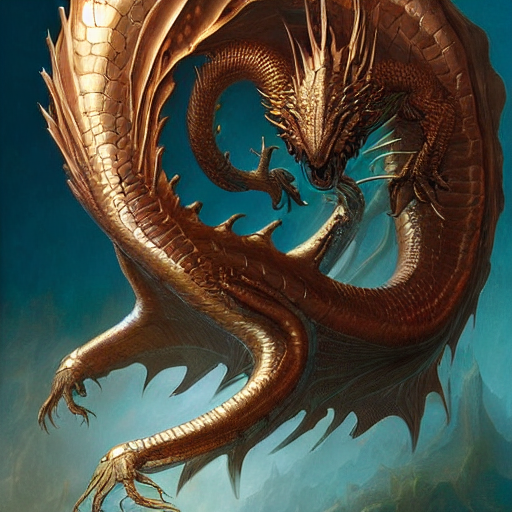

Shadows obscure the hills, Young Copper Dragon, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo


  0%|          | 0/101 [00:00<?, ?it/s]

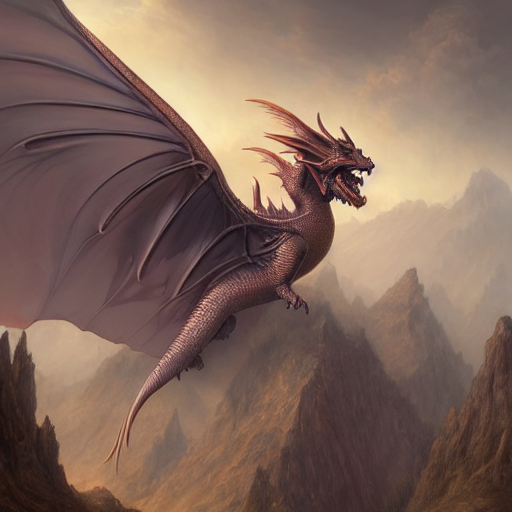

and from them a serpentine creature the size of an ox emerges with an otherworldly grace,  Shadows obscure the hills, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo


  0%|          | 0/101 [00:00<?, ?it/s]

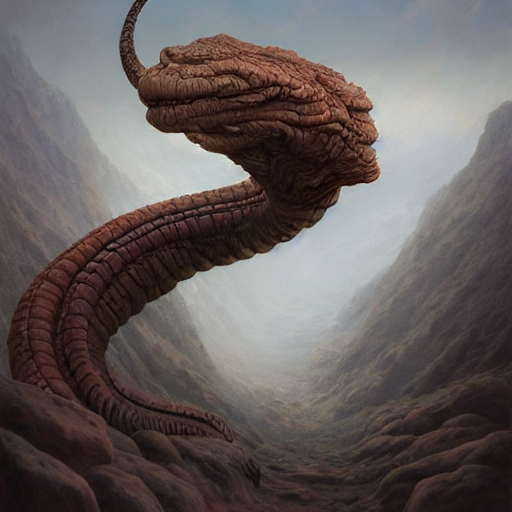

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['jo <|endoftext|>']


wings tucked tight against its sides,  and from them a serpentine creature the size of an ox emerges with an otherworldly grace, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo


  0%|          | 0/101 [00:00<?, ?it/s]

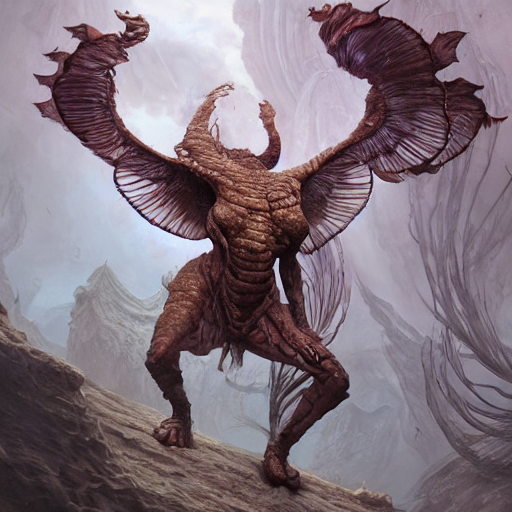

The dappled sunlight catches scales of gleaming copper,  wings tucked tight against its sides, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo


  0%|          | 0/101 [00:00<?, ?it/s]

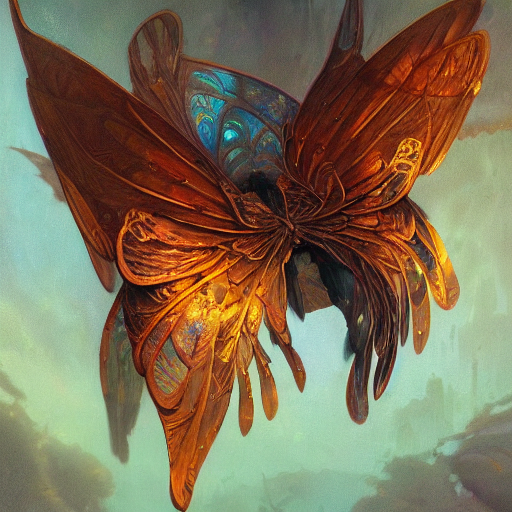

A hiss issues forth,  The dappled sunlight catches scales of gleaming copper, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo


  0%|          | 0/101 [00:00<?, ?it/s]

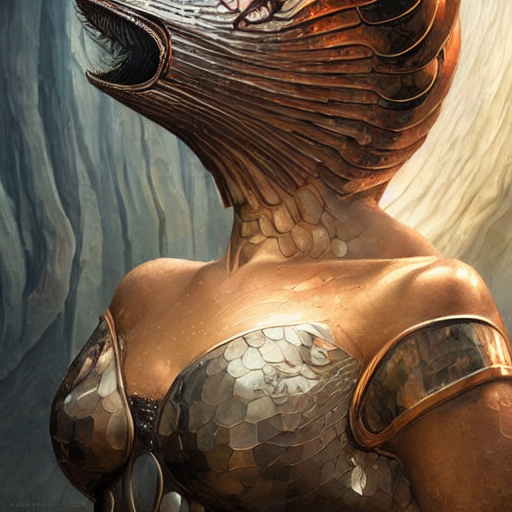

reptilian,  A hiss issues forth, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo


  0%|          | 0/101 [00:00<?, ?it/s]

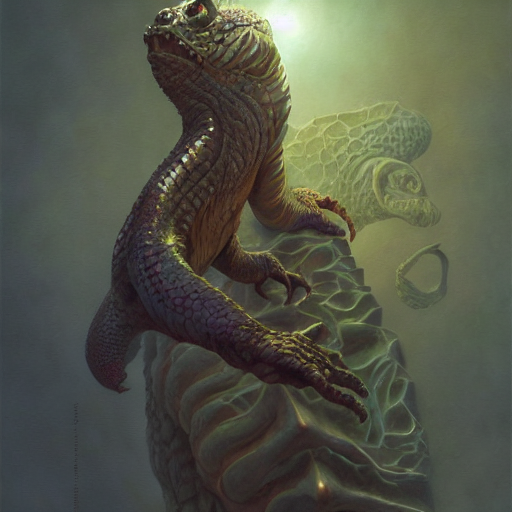

as the creature regards you with cunning eyes and slowly circles—watching and waiting,  reptilian, centered, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo


  0%|          | 0/101 [00:00<?, ?it/s]

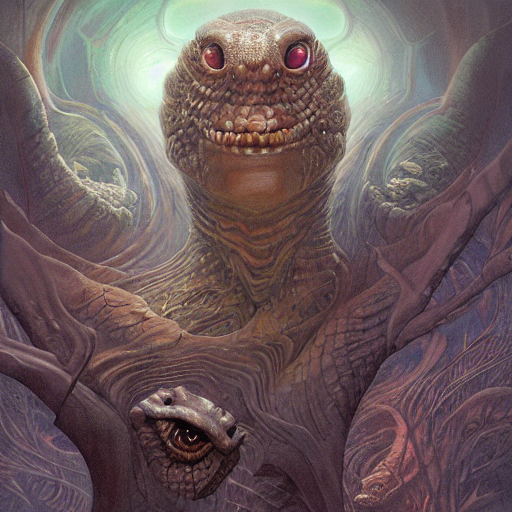

In [82]:
for i in range (len(prompt_list) -1):
  if i == 0:
    image_prompt = prompt_you_want(1)
  else:
    image_prompt = prompt_you_want(i+1)
  print(image_prompt)
  seedValue=random.randint(0,4294967295)
  generator = torch.Generator("cuda").manual_seed(seedValue)
  image = pipe(image_prompt, guidance_scale=7.5, num_inference_steps = 100, generator=generator).images[0]
  display(image)
  image.save(str(df.iloc[index_of_description][0]).lower().replace(" ", "") + str(i) + ".png")

In [83]:
!pip install ffmpeg-python
# get duration of audio
import ffmpeg
probe = ffmpeg.probe(str(df.iloc[index_of_description][0]).lower().replace(" ", "") + '.wav')
duration = round(float((probe['streams'][0]['duration'])),2)
print("Total time of audio: " + str(duration))
per_prompt = round(duration/len(prompt_list),2)
print("Time spent for image(s) per prompt: " + str(per_prompt))
framerate = round(1/per_prompt,2)
print(framerate)
# list of sorted
import glob
images = glob.glob('/content' + '/*.png')
images.sort()
print(images)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Total time of audio: 23.67
Time spent for image(s) per prompt: 2.63
0.38
['/content/youngcopperdragon0.png', '/content/youngcopperdragon1.png', '/content/youngcopperdragon2.png', '/content/youngcopperdragon3.png', '/content/youngcopperdragon4.png', '/content/youngcopperdragon5.png', '/content/youngcopperdragon6.png', '/content/youngcopperdragon7.png']


In [84]:
!ffmpeg -framerate $framerate -pattern_type glob -i "*.png" -vcodec libx264 \
-pix_fmt yuv420p -r 30 -threads 4 -crf 25 -refs 1 -bf 0 -coder 0 -g 25 \
-keyint_min 15 -movflags +faststart temp.mp4

ffmpeg version 3.4.11-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-li

In [85]:
spoof_audio = str(df.iloc[index_of_description][0]).lower().replace(" ", "") + '.wav'
print(spoof_audio)
output_filename = str(df.iloc[index_of_description][0]).lower().replace(" ", "") + '.mp4'
print(output_filename)
!ffmpeg -i temp.mp4 -i $spoof_audio -map 0:v -map 1:a -c:v copy $output_filename

youngcopperdragon.wav
youngcopperdragon.mp4
ffmpeg version 3.4.11-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 -

In [86]:
!cp $output_filename '/content/drive/MyDrive/Spoofs_animated/'

In [87]:
# # reset
# !rm *.png
# !rm *.wav
# !rm *.mp4

# Generation variations of images (in progress)

In [ ]:
# # so let's say we want
# fps = 12 #@param
# frames_per_prompt = int(fps * per_imagedur)
# print("Number of variations per image prompt to produce: " + str(frames_per_prompt))

In [ ]:
# # generate aforementioned # of frames given the seedValue of the init image you want per prompt

# # optional, if you chose specific init frames and took down their seedValues add to this list
# # seedValuelist = [1339312767, 2562646463, 873899908, 3754088160, 1829858793, 926356445, 1608025673, 2536391013, 4097297336, 3701317364]
# if seedValuelist != None:
#   counter = 0
#   for initframe in seedValuelist:
#     seedValue = initframe
#     for i in range(fps):
#       generator = torch.Generator("cuda").manual_seed(seedValue)
#       # initdict[i] = [seedValue, str(df.iloc[index_of_description][0] + str(i) + ".png")]
#       if i in range(int(frames_per_prompt/2)):
#         image = pipe(image_prompt, guidance_scale=7.5, num_inference_steps = 50 - int((frames_per_prompt/2)) + i, generator=generator).images[0]
#         display(image)
#         image.save(str(df.iloc[index_of_description][0]).lower().replace(" ", "") + str(counter) + ".png")    
#       else:
#         image = pipe(image_prompt, guidance_scale=7.5, num_inference_steps = 50 + int((frames_per_prompt/2)) - i, generator=generator).images[0]
#         display(image)
#         image.save(df.iloc[index_of_description][0] + str(counter) + ".png")
#       counter += 1
# else:
#   counter = 0
#   for initframe in range(len(prompt_list)):
#     seedValue = random.randint(0,4294967295)
#     for i in range(fps):
#       generator = torch.Generator("cuda").manual_seed(seedValue)
#       # initdict[i] = [seedValue, str(df.iloc[index_of_description][0] + str(i) + ".png")]
#       if i in range(int(frames_per_prompt/2)):
#         image = pipe(image_prompt, guidance_scale=7.5, num_inference_steps = 50 - int((frames_per_prompt/2)) + i, generator=generator).images[0]
#         display(image)
#         image.save(str(df.iloc[index_of_description][0]).lower().replace(" ", "") + str(counter) + ".png")    
#       else:
#         image = pipe(image_prompt, guidance_scale=7.5, num_inference_steps = 50 + int((frames_per_prompt/2)) - i, generator=generator).images[0]
#         display(image)
#         image.save(df.iloc[index_of_description][0] + str(counter) + ".png")
#       counter += 1

In [ ]:
# get img2img for variations between prompt init frames
# !git clone https://github.com/runwayml/stable-diffusion.git

In [ ]:
# # MT can't get img2img to work...
# # which would make the 2nd prompt for the init image...
# prompt_you_want = ""
# prompt_num = 2
# for i in range(prompt_num):
#   if i == 0:
#     prompt_you_want = prompt_list[i] + style_description
#     # print(prompt_you_want)
#   else:
#     prompt_you_want = ""
#     prompt_you_want += prompt_list[i] + ", " + prompt_list[i-1]
#     prompt_you_want += style_description
# print(prompt_you_want)

In [ ]:
# ## Lagging Prompt Method
# # trying using prompt followed by previous prompt to try to increase cohesiveness
# import random

# iters = len(prompt_list)
# image_prompt = ""
# seedValue = 1202122963
# initdict = {}
# for i in range (len(prompt_list) -1):
#   if i == 0:
#     image_prompt = prompt_list[i]
#   else:
#     image_prompt = prompt_list[i] + ", " + prompt_list[i-1]
#   # temp = image_prompt
#   image_prompt += style_description
#   print(image_prompt)
#   if seedValue == None:
#     seedValue=random.randint(0,4294967295)
#     generator = torch.Generator("cuda").manual_seed(seedValue)
#   else:
#     seedValue=seedValue
#     generator = torch.Generator("cuda").manual_seed(seedValue)
#   print("Seed value: ", seedValue)
#   initdict[i] = [seedValue, str(df.iloc[index_of_description][0] + str(i) + ".png")]
#   image = pipe(image_prompt, guidance_scale=7.5, num_inference_steps = 100, generator=generator).images[0]
#   # image_prompt = temp
#   display(image)
#   image.save(df.iloc[index_of_description][0] + str(i) + "individualpromps" + ".png")
  
  

In [ ]:
# !pip install omegaconf
# !pip install einops
# !pip install ldm
# !pip install pytorch-lightning
# from torchvision.datasets.utils import download_url
# import ldm.util
# from ldm.util import instantiate_from_config
# import torch
# import os
# # todo ?
# from google.colab import files
# from IPython.display import Image as ipyimg
# import ipywidgets as widgets
# from PIL import Image
# from numpy import asarray
# from einops import rearrange, repeat
# import torch, torchvision
# from ldm.models.diffusion.ddim import DDIMSampler
# from ldm.util import ismap
# import time
# from omegaconf import Omegaconf

In [ ]:
# import os
# # os.chdir()
# path_to_img = "/content/nightmarenimbus.png"
# !python /content/stable-diffusion/scripts/img2img.py --prompt $prompt_you_want --init-img $path_to_img --strength 0.8


In [ ]:
# # not incredibly cohesive, will try having individual prompt fragments used to generate images
# iters = len(prompt_list)
# image_prompt = ""
# seedValue = 479265110
# initdict = {}
# for i in range (len(prompt_list) -1):
#   image_prompt = prompt_list[i]
#   # temp = image_prompt
#   image_prompt += style_description
#   print(image_prompt)
#   generator = torch.Generator("cuda").manual_seed(seedValue)
#   print("Seed value: ", seedValue)
#   initdict[i] = [seedValue, str(df.iloc[index_of_description][0] + str(i) + ".png")]
#   image = pipe(image_prompt, guidance_scale=7.5, num_inference_steps = 100, generator=generator).images[0]
#   # image = pipe(image_prompt).images[0]  
#   display(image)
#   image.save(df.iloc[index_of_description][0] + str(i) + "individualpromps" + ".png")
  
  

In [ ]:
# # iterate through producting images using increasingly longer prompts
# iters = len(prompt_list)
# image_prompt = ""
# style_description = ", digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm, tomasz alen kopera, peter mohrbacher, donato giancola, joseph christian leyendecker, wlop, boris vallejo"
# # generator = torch.Generator("cuda").manual_seed(1024)
# # images = pipe(prompt, guidance_scale=8, num_inference_steps = 100, generator=generator).images
# seedValue = 479265110
# initdict = {}
# for i in range (len(prompt_list) - 1):
#   image_prompt += prompt_list[i]
#   temp = image_prompt
#   image_prompt += style_description
#   print(image_prompt)
#   # seedValue=random.randint(0,4294967295)
#   generator = torch.Generator("cuda").manual_seed(seedValue)
#   print("Seed value: ", seedValue)
#   initdict[i] = [seedValue, str(df.iloc[index_of_description][0] + str(i) + ".png")]
#   image = pipe(image_prompt, guidance_scale=7.5, num_inference_steps = 100, generator=generator).images[0]
#   # image = pipe(image_prompt).images[0]  
#   display(image)
#   image.save(df.iloc[index_of_description][0] + str(i) + ".png")
#   image_prompt = temp
# print(initdict)

In [15]:
# # for displaying groups of images to select the init image you want
# from PIL import Image

# def image_grid(imgs, rows, cols):
#     assert len(imgs) == rows*cols

#     w, h = imgs[0].size
#     grid = Image.new('RGB', size=(cols*w, rows*h))
#     grid_w, grid_h = grid.size
    
#     for i, img in enumerate(imgs):
#         grid.paste(img, box=(i%cols*w, i//cols*h))
#     return grid

In [ ]:
# #@title Make a Video
# fps = 12#@param {type:"number"}

# filepath = os.path.join(opt.outdir, f"{batch_name}({batch_idx})_%04d.png")

# import subprocess
# from base64 import b64encode

# image_path = os.path.join(opt.outdir, f"{batch_name}({batch_idx})_%04d.png")
# mp4_path = os.path.join(opt.outdir, f"{batch_name}({batch_idx}).mp4")

# print(f"{image_path} -> {mp4_path}")

# # make video
# cmd = [
#     'ffmpeg',
#     '-y',
#     '-vcodec', 'png',
#     '-r', str(fps),
#     '-start_number', str(0),
#     '-i', image_path,
#     '-c:v', 'libx264',
#     '-vf',
#     f'fps={fps}',
#     '-pix_fmt', 'yuv420p',
#     '-crf', '17',
#     '-preset', 'veryfast',
#     mp4_path
# ]
# process = subprocess.Popen(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
# stdout, stderr = process.communicate()
# if process.returncode != 0:
#     print(stderr)
#     raise RuntimeError(stderr)

# mp4 = open(mp4_path,'rb').read()
# data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
# display(HTML(f'<video controls loop><source src="{data_url}" type="video/mp4"></video>') )